In [56]:
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import time
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as Datasets
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML


plt.rcParams["figure.figsize"] = ((8, 8))

manualSeed = 123
random.seed(manualSeed)
torch.manual_seed(manualSeed)

In [126]:
os.path.join('')
dataroot = 'pokemon_jpg'


num_workers = 2
batch_size = 128
image_size = 64
nc = 3 # number of channels in the training images- since theyre rbg, 3
nz = 100 # number of z latent vector (size of generator input)
ngf = 64 # size of feature maps in generator
ndf = 64 # size of feature maps in discriminator 
num_epochs = 500 # number of training epochs 
lr = 0.0002 # learning rate
beta1 = 0.5 # beta1 hyperparameter for adam optimizers 
ngpu = 1 # number of gpus vailable; 0 for cpu mode 

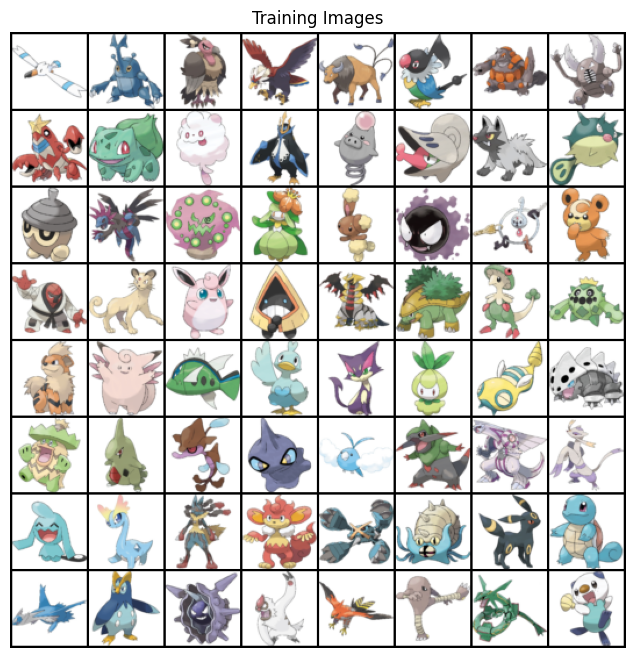

In [127]:
dataset = Datasets.ImageFolder(
    root = dataroot 
    , transform = transforms.Compose([
        transforms.Resize(image_size)
        , transforms.CenterCrop(image_size)
        , transforms.ToTensor()
        , transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ])
)

dataloader = torch.utils.data.DataLoader(
    dataset 
    , batch_size = batch_size
    , shuffle = True 
    , num_workers = num_workers
)

device = torch.device(
    "cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu"
)

real_batch = next(iter(dataloader))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64]
    , padding = 2, normalize = True).cpu(), (1, 2, 0)))

In [128]:
'''Weight Initialization'''

def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [129]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, input):
        return self.main(input)

In [130]:
'''Create the generator'''
netG = Generator(ngpu).to(device)

if(device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

netG.apply(weights_init)

print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [131]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [132]:
'''Create the discriminator'''
netD = Discriminator(ngpu).to(device)

if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

netD.apply(weights_init)

print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [133]:
'''Initialize the BCELoss function'''
criterion = nn.BCELoss()

fixed_noise = torch.randn(64, nz, 1, 1, device = device)

real_label = 1.
fake_label = 0.

optimizerD = optim.Adam(
    netD.parameters(), lr = lr, betas = (beta1, 0.999)
)
optimizerG = optim.Adam(
    netG.parameters(), lr = lr, betas = (beta1, 0.999)
)

In [134]:
'''Training Loop'''
start = time.time()
img_list = []
G_losses = []
D_losses = []
iters = 0 

print(
"""
TOO SOON! YOU HAVE AWAKENED ME TOO SOON, EXECUTUS! WHAT IS THE MEANING OF THIS INTRUSION?

These mortal infidels, my lord! They have invaded your sanctum and seek to steal your secrets!
"""
)

for epoch in range(num_epochs):
    for i, data in enumerate(dataloader, 0):

        '''
        Train with all real batch
        '''
        netD.zero_grad()
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        output = netD(real_cpu).view(-1)
        errD_real = criterion(output, label)
        errD_real.backward()
        D_x = output.mean().item()

        '''
        Train with all fake batch
        '''
        noise = torch.randn(b_size, nz, 1, 1, device = device)
        fake = netG(noise)
        label.fill_(fake_label)
        output = netD(fake.detach()).view(-1)
        errD_fake = criterion(output, label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake 
        optimizerD.step()

        '''
        Update G network: maximize log(D(G(z)))
        '''
        netG.zero_grad()
        label.fill_(real_label)
        output = netD(fake).view(-1)
        errG = criterion(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()

        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
                
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader) -1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding = 2, normalize = True))
        iters += 1
end = time.time()
print("time elapsed: {}".format(end - start))


TOO SOON! YOU HAVE AWAKENED ME TOO SOON, EXECUTUS! WHAT IS THE MEANING OF THIS INTRUSION?

These mortal infidels, my lord! They have invaded your sanctum and seek to steal your secrets!

[0/500][0/7]	Loss_D: 1.8035	Loss_G: 5.2535	D(x): 0.4924	D(G(z)): 0.5389 / 0.0077
[1/500][0/7]	Loss_D: 0.3060	Loss_G: 9.5978	D(x): 0.9536	D(G(z)): 0.1906 / 0.0001
[2/500][0/7]	Loss_D: 0.1281	Loss_G: 11.9893	D(x): 0.9766	D(G(z)): 0.0894 / 0.0000
[3/500][0/7]	Loss_D: 0.1516	Loss_G: 8.7769	D(x): 0.9903	D(G(z)): 0.1250 / 0.0002
[4/500][0/7]	Loss_D: 0.1808	Loss_G: 7.5449	D(x): 0.9761	D(G(z)): 0.1311 / 0.0007
[5/500][0/7]	Loss_D: 1.5375	Loss_G: 19.3154	D(x): 0.9634	D(G(z)): 0.7247 / 0.0000
[6/500][0/7]	Loss_D: 1.0875	Loss_G: 19.6251	D(x): 0.9780	D(G(z)): 0.5993 / 0.0000
[7/500][0/7]	Loss_D: 1.1234	Loss_G: 14.6289	D(x): 0.4811	D(G(z)): 0.0000 / 0.0000
[8/500][0/7]	Loss_D: 0.2854	Loss_G: 9.2960	D(x): 0.8037	D(G(z)): 0.0003 / 0.0001
[9/500][0/7]	Loss_D: 0.7613	Loss_G: 6.5487	D(x): 0.5873	D(G(z)): 0.0007 / 0.002

In [138]:
torch.save(netD.state_dict(), 'Discriminator_state_dict.pth')
torch.save(netG.state_dict(), 'Generator_state_dict.pth')

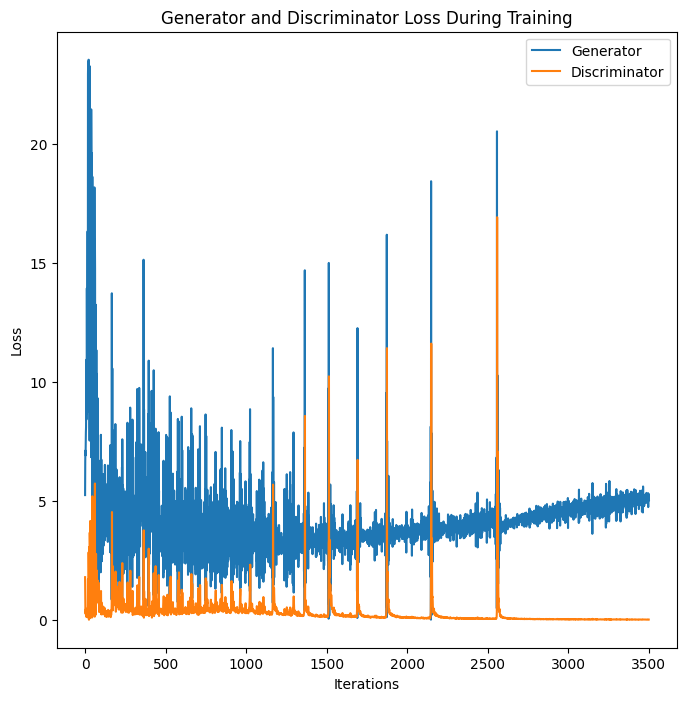

In [135]:
'''Checking Results'''
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses, label = "Generator")
plt.plot(D_losses, label = "Discriminator")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

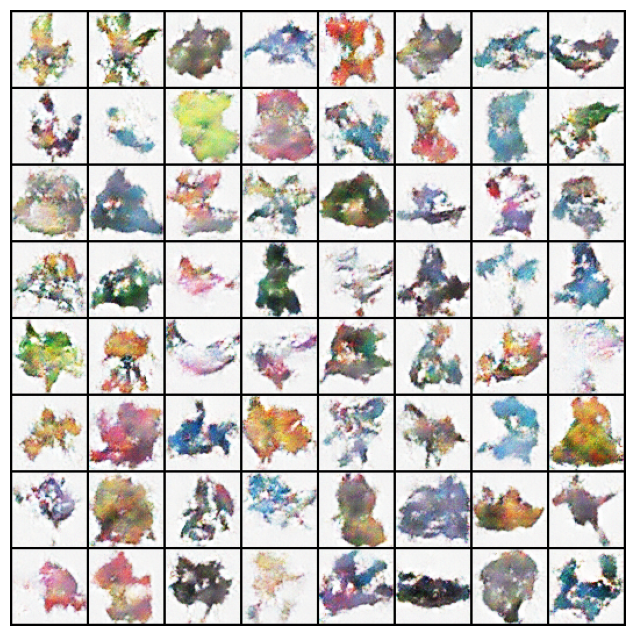

In [136]:
'''Showing the G's Progression'''

fig = plt.figure(figsize = (8, 8)) # Overwritting rcParams from first block for animation function
plt.axis("off")
ims = [[plt.imshow(np.transpose(i, (1, 2, 0)), animated = True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval = 100, repeat_delay = 1000, blit = True)
HTML(ani.to_jshtml())

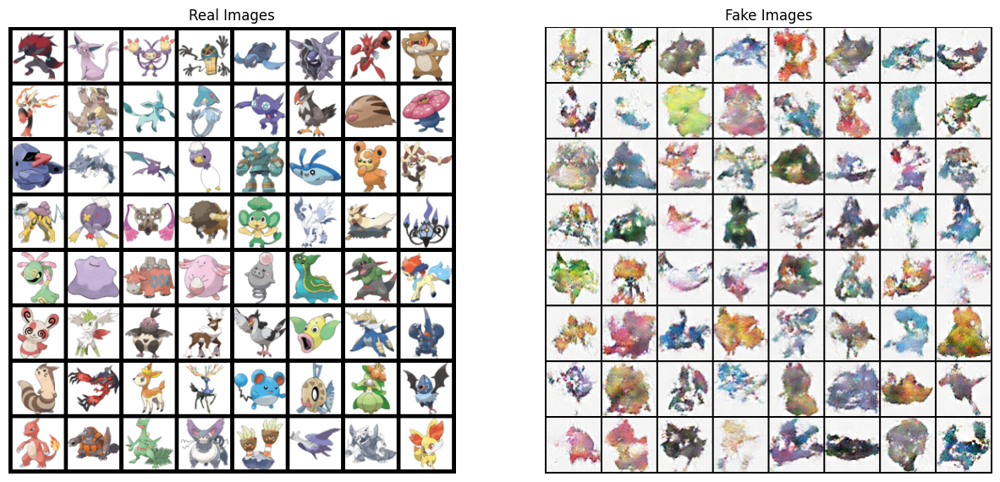

In [137]:
real_batch = next(iter(dataloader))

plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()